<a href="https://colab.research.google.com/github/Debodeep94/Covid-and-choropleth/blob/main/Covid_19_India_update_Personal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
! pip install geopandas


     |████████████████████████████████| 1.0 MB 5.1 MB/s 
     |████████████████████████████████| 6.3 MB 22.4 MB/s 
     |████████████████████████████████| 15.4 MB 38 kB/s 


In [ ]:
!pip install plotly==4.14.3

     |████████████████████████████████| 13.2 MB 90 kB/s 
  Attempting uninstall: plotly
    Found existing installation: plotly 4.4.1
    Uninstalling plotly-4.4.1:
      Successfully uninstalled plotly-4.4.1


In [ ]:
!pip install geojson

In [ ]:
import geojson
import numpy as np
import pandas as pd
import json
import matplotlib.pyplot as plt
import plotly.express as px
import datetime
#%matplotlib notebook
import geopandas as gpd

In [ ]:
# import the parent data
cov_st=pd.read_json("https://api.covid19india.org/states_daily.json")
cov_st.head()

,states_daily
0,"{'an': '0', 'ap': '1', 'ar': '0', 'as': '0', '..."
1,"{'an': '0', 'ap': '0', 'ar': '0', 'as': '0', '..."
2,"{'an': '0', 'ap': '0', 'ar': '0', 'as': '0', '..."
3,"{'an': '0', 'ap': '0', 'ar': '0', 'as': '0', '..."
4,"{'an': '0', 'ap': '0', 'ar': '0', 'as': '0', '..."


### Confirmed Cases

In [ ]:
# Here we will work on only the confirmed cases
# Hence we will stick to only the 'Confirmed' status
cov_st_df=pd.DataFrame(list(cov_st["states_daily"]))
cov_cnf=cov_st_df[cov_st_df["status"]=="Confirmed"].reset_index(drop=True)
date=pd.DataFrame(cov_cnf.dateymd)
 
# Drop the unnecessary columns
cov_cnf=cov_cnf.drop(columns=['dateymd','date','status','un','tt'],axis=1)
conf_df=cov_cnf.iloc[:,0:37].astype(int).cumsum()
conf_df.tail(5)

,an,ap,ar,as,br,ch,ct,dd,dl,dn,ga,gj,hp,hr,jh,jk,ka,kl,la,ld,mh,ml,mn,mp,mz,nl,or,pb,py,rj,sk,tg,tn,tr,up,ut,wb
423,6422,1322934,20576,304327,612570,51857,873060,0,1348699,9090,124774,703593,140759,640252,296869,224898,2013193,1967406,15564,4087,5179929,20531,36364,691232,7795,16515,554666,459268,75026,789274,10179,506478,1438509,38155,1545212,256934,1032740
424,6466,1344386,20855,309984,622433,52633,883210,0,1361986,9194,127639,714610,145736,652742,301231,229407,2053191,2010935,15807,4202,5226710,20937,37030,700202,8035,16853,565648,467539,77033,805658,10406,511201,1468864,38571,1563235,264683,1053117
425,6506,1366785,21111,315452,630185,53393,892331,0,1372475,9294,130130,725352,150673,665028,306222,233763,2088488,2050890,15916,4395,5269292,21528,37590,708621,8176,17219,576297,475949,78975,821525,10637,515894,1499485,39051,1580980,271810,1073956
426,6538,1388803,21374,319530,637679,54043,899925,0,1380981,9348,132585,735347,153717,675636,309998,236790,2130267,2085584,16156,4568,5309215,22155,38316,716708,8377,17494,588687,483984,80949,835814,10869,520199,1531377,39603,1596627,277585,1094802
427,6564,1411320,21623,324877,645015,54703,907589,0,1387411,9428,134542,744408,157862,685312,313155,240467,2171931,2118264,16333,4650,5344063,22715,39046,724279,8499,17798,600492,490755,82547,849379,11084,524497,1565035,40052,1609140,283239,1114313


In [ ]:
lim=conf_df.shape[0]-1

In [ ]:
# Formation of final dataset
# Here we will consider the last row of the conf_df table as the last row represents the cumulative total of the cases.
 
df_confirmed=pd.DataFrame(conf_df.iloc[lim]).reset_index()
df_confirmed.columns=["states_code","count"]
df_confirmed["states_full_name"]=["Andaman & Nicobar","Andhra Pradesh","Arunachal Pradesh","Assam","Bihar","Chandigarh","Chhattishgarh"
,"Dadara & Nagar Havelli","Delhi","Daman and Diu and Dadra and Nagar Haveli","Goa","Gujarat","Himachal Pradesh","Haryana","Jharkhand","Jammu and Kashmir","Karnataka",
"Kerala","Ladakh","Lakshadweep","Maharashtra","Meghalaya","Manipur","Madhya Pradesh","Mizoram","Nagaland","Odisha","Punjab",
"Puducherry","Rajasthan","Sikkim","Telengana","Tamilnadu","Tripura","Uttar Pradesh","Uttarakhand","West Bengal"]
df_confirmed=df_confirmed[["states_full_name","states_code","count"]]
df_confirmed=df_confirmed[df_confirmed['states_full_name']!='Dadara & Nagar Havelli']
df_confirmed

,states_full_name,states_code,count
0,Andaman & Nicobar,an,6564
1,Andhra Pradesh,ap,1411320
2,Arunachal Pradesh,ar,21623
3,Assam,as,324877
4,Bihar,br,645015
5,Chandigarh,ch,54703
6,Chhattishgarh,ct,907589
8,Delhi,dl,1387411
9,Daman and Diu and Dadra and Nagar Haveli,dn,9428
10,Goa,ga,134542


In [ ]:
df_confirmed=df_confirmed.drop("states_code",axis='columns')

In [ ]:
df_confirmed

,states_full_name,count
0,Andaman & Nicobar,6564
1,Andhra Pradesh,1411320
2,Arunachal Pradesh,21623
3,Assam,324877
4,Bihar,645015
5,Chandigarh,54703
6,Chhattishgarh,907589
8,Delhi,1387411
9,Daman and Diu and Dadra and Nagar Haveli,9428
10,Goa,134542


In [ ]:
fp = "/content/drive/MyDrive/shape_file_updated/India_State_Boundary.shp"
map_df = gpd.read_file(fp)
map_df

,State_Name,geometry
0,Andaman & Nicobar,"MULTIPOLYGON (((10341718.474 1449533.161, 1034..."
1,Chandigarh,"POLYGON ((8546255.616 3606050.813, 8546315.400..."
2,Daman and Diu and Dadra and Nagar Haveli,"MULTIPOLYGON (((8122247.822 2312434.407, 81223..."
3,Delhi,"POLYGON ((8583390.570 3359116.190, 8583476.212..."
4,Haryana,"POLYGON ((8524318.539 3516490.865, 8524451.392..."
5,Jharkhand,"POLYGON ((9762288.285 2772949.712, 9762301.816..."
6,Karnataka,"MULTIPOLYGON (((8608594.474 2090389.205, 86086..."
7,Kerala,"POLYGON ((8347733.191 1436381.747, 8347795.745..."
8,Lakshadweep,"MULTIPOLYGON (((8135256.290 930182.487, 813526..."
9,Madhya Pradesh,"POLYGON ((8724343.278 3106498.184, 8724579.382..."


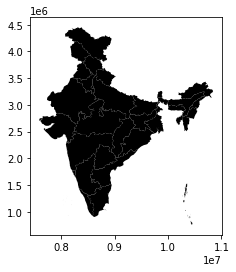

In [ ]:
map_df.plot(color='black')

In [ ]:
merged = map_df.set_index('State_Name').join(df_confirmed.set_index('states_full_name'))
merged.reset_index(level=0, inplace=True)
merged

,index,geometry,states_code,count
0,Andaman & Nicobar,"MULTIPOLYGON (((10341718.474 1449533.161, 1034...",an,5145
1,Andhra Pradesh,"POLYGON ((9426056.496 2174632.352, 9426228.484...",ap,915832
2,Arunachal Pradesh,"POLYGON ((10696175.277 3434232.650, 10696981.8...",ar,16873
3,Assam,"POLYGON ((10380499.251 2872443.723, 10380499.2...",as,219170
4,Bihar,"POLYGON ((9362949.333 3188807.607, 9362966.106...",br,273830
5,Chandigarh,"POLYGON ((8546255.616 3606050.813, 8546315.400...",ch,29521
6,Chhattishgarh,"POLYGON ((9275926.808 2765881.317, 9276185.437...",ct,407231
7,Daman and Diu and Dadra and Nagar Haveli,"MULTIPOLYGON (((8122247.822 2312434.407, 81223...",dn,3800
8,Delhi,"POLYGON ((8583390.570 3359116.190, 8583476.212...",dl,698005
9,Goa,"POLYGON ((8223217.424 1779394.764, 8223279.301...",ga,60811


In [ ]:
merged=merged.drop(merged.index[27])

### Visualization:

In [ ]:
# create figure and axes for Matplotlib and set the title
fig, ax = plt.subplots(1, figsize=(25, 12),dpi=500)
ax.axis('off')
ax.set_title('Covid-19 confirmed cases[Latest development]', fontdict={'fontsize': '25', 'fontweight' : '3'})
 
# plot the figure
merged.plot(column='count', cmap='Wistia', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)\
 
#Annotation
merged['coords'] = merged['geometry'].apply(lambda x: x.representative_point().coords[:])
merged['coords'] = [coords[0] for coords in merged['coords']]
 
#merged.plot()
for idx, row in merged.iterrows():
    plt.annotate(s=row['count'], xy=row['coords'],
                 horizontalalignment='right',color='red',fontsize=6)
    
#merged.plot()
for idx, row in merged.iterrows():
    plt.annotate(s="("+row['states_code']+")", xy=row['coords'],
                 horizontalalignment='left',color='limegreen',fontsize=6, fontstyle='bold')

NameError: ignored

### Recovered

In [ ]:
cov_st_df=pd.DataFrame(list(cov_st["states_daily"]))
cov_rec=cov_st_df[cov_st_df["status"]=="Recovered"].reset_index(drop=True)
date=pd.DataFrame(cov_rec.date)
cov_rec=cov_rec.drop(columns=['date','dateymd','status','un','tt'],axis=1)
rec_df=cov_rec.iloc[:,0:37].astype(int).cumsum()
rec_df.tail(5)

,an,ap,ar,as,br,ch,ct,dd,dl,dn,ga,gj,hp,hr,jh,jk,ka,kl,la,ld,mh,ml,mn,mp,mz,nl,or,pb,py,rj,sk,tg,tn,tr,up,ut,wb
385,4978,889295,16785,215549,262988,24309,323201,0,648674,3448,55989,296714,60332,281257,120724,126860,961360,1100181,9790,696,2495315,13729,28979,279275,4436,11980,337635,216108,39974,323031,5968,302207,863258,33052,600577,95825,572474
386,4981,890137,16785,215597,263233,24661,326277,0,651351,3467,56156,298738,60588,282367,120872,127049,963420,1102354,9802,699,2522823,13731,28986,281476,4439,11980,337935,219063,40083,323618,5971,302500,865071,33052,601440,95973,573118
387,4992,891048,16785,215657,263582,25033,327689,0,654287,3485,56298,300766,60856,283868,121310,127290,965276,1104220,9810,707,2549075,13738,28995,283540,4444,11980,338150,221578,40178,324145,5971,302768,866913,33062,602319,96296,573782
388,5001,891883,16786,215691,263849,25375,329408,0,656617,3513,56393,302933,61312,284983,121608,127520,968763,1106118,9824,707,2583331,13742,28996,285743,4445,11982,338416,223928,40317,324996,5978,303013,868722,33068,603495,96647,574504
389,5011,892736,16788,215722,264402,25688,333227,0,659980,3532,56531,305150,61538,286181,121885,127774,971557,1108073,9836,711,2613627,13743,28996,287869,4451,11984,338662,226887,40442,325779,5979,303298,870546,33069,604979,96735,575371


In [ ]:
lim=rec_df.shape[0]-1

In [ ]:

df_recovered=pd.DataFrame(rec_df.iloc[lim]).reset_index()
df_recovered.columns=["states_code","count"]
df_recovered["states_full_name"]=["Andaman & Nicobar","Andhra Pradesh","Arunachal Pradesh","Assam","Bihar","Chandigarh","Chhattisgarh"
,"Dadara & Nagar Havelli","Delhi","Daman and Diu and Dadra and Nagar Haveli","Goa","Gujarat","Himachal Pradesh","Haryana","Jharkhand","Jammu & Kashmir","Karnataka",
"Kerala","Ladakh","Lakshadweep","Maharashtra","Meghalaya","Manipur","Madhya Pradesh","Mizoram","Nagaland","Odisha","Punjab",
"Puducherry","Rajasthan","Sikkim","Telangana","Tamil Nadu","Tripura","Uttar Pradesh","Uttarakhand","West Bengal"]
df_recovered=df_recovered[["states_full_name","states_code","count"]]
df_recovered=df_recovered[df_recovered['states_full_name']!='Dadara & Nagar Havelli']
df_recovered

,states_full_name,states_code,count
0,Andaman & Nicobar,an,5011
1,Andhra Pradesh,ap,892736
2,Arunachal Pradesh,ar,16788
3,Assam,as,215722
4,Bihar,br,264402
5,Chandigarh,ch,25688
6,Chhattisgarh,ct,333227
8,Delhi,dl,659980
9,Daman and Diu and Dadra and Nagar Haveli,dn,3532
10,Goa,ga,56531


In [ ]:

merged_rec= map_df.set_index('State_Name').join(df_recovered.set_index('states_full_name'))
merged_rec.reset_index(level=0, inplace=True)
merged_rec

,index,geometry,states_code,count
0,Andaman & Nicobar,"MULTIPOLYGON (((10341718.474 1449533.161, 1034...",an,5001
1,Andhra Pradesh,"POLYGON ((9426056.496 2174632.352, 9426228.484...",ap,891883
2,Arunachal Pradesh,"POLYGON ((10696175.277 3434232.650, 10696981.8...",ar,16786
3,Assam,"POLYGON ((10380499.251 2872443.723, 10380499.2...",as,215691
4,Bihar,"POLYGON ((9362949.333 3188807.607, 9362966.106...",br,263849
5,Chandigarh,"POLYGON ((8546255.616 3606050.813, 8546315.400...",ch,25375
6,Chhattishgarh,"POLYGON ((9275926.808 2765881.317, 9276185.437...",ct,329408
7,Daman and Diu and Dadra and Nagar Haveli,"MULTIPOLYGON (((8122247.822 2312434.407, 81223...",dn,3513
8,Delhi,"POLYGON ((8583390.570 3359116.190, 8583476.212...",dl,656617
9,Goa,"POLYGON ((8223217.424 1779394.764, 8223279.301...",ga,56393


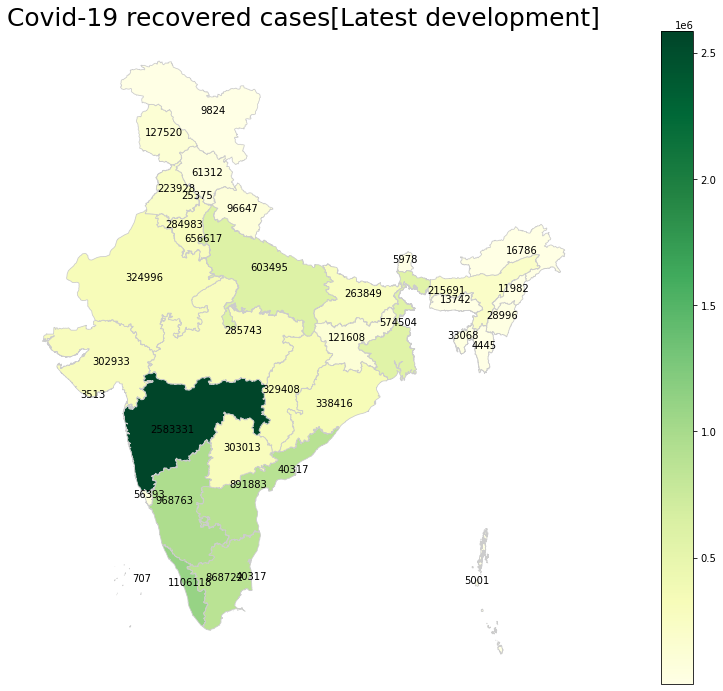

In [ ]:
# create figure and axes for Matplotlib and set the title
fig, ax = plt.subplots(1, figsize=(25, 12))
ax.axis('off')
ax.set_title('Covid-19 recovered cases[Latest development]', fontdict={'fontsize': '25', 'fontweight' : '3'})

# plot the figure
merged_rec.plot(column='count', cmap='YlGn', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)\

#Annotation
merged_rec['coords'] = merged_rec['geometry'].apply(lambda x: x.representative_point().coords[:])
merged_rec['coords'] = [coords[0] for coords in merged_rec['coords']]

#merged.plot()
for idx, row in merged_rec.iterrows():
    plt.annotate(s=row['count'], xy=row['coords'],
                 horizontalalignment='center',color='black')

WEST BENGAL

In [ ]:
!pip install plotly


In [ ]:
import plotly.graph_objects as go

In [ ]:
data=pd.read_csv("https://api.covid19india.org/csv/latest/districts.csv")

In [ ]:
data

,Date,State,District,Confirmed,Recovered,Deceased,Other,Tested
0,2020-04-26,Andaman and Nicobar Islands,Unknown,33,11,0,0,NaN
1,2020-04-26,Andhra Pradesh,Anantapur,53,14,4,0,NaN
2,2020-04-26,Andhra Pradesh,Chittoor,73,13,0,0,NaN
3,2020-04-26,Andhra Pradesh,East Godavari,39,12,0,0,NaN
4,2020-04-26,Andhra Pradesh,Guntur,214,29,8,0,NaN
...,...,...,...,...,...,...,...,...
271074,2021-06-20,West Bengal,Purba Bardhaman,38432,37677,163,0,NaN
271075,2021-06-20,West Bengal,Purba Medinipur,57114,54205,355,0,NaN
271076,2021-06-20,West Bengal,Purulia,18959,18770,112,0,NaN
271077,2021-06-20,West Bengal,South 24 Parganas,93410,90646,1224,0,NaN


In [ ]:
data_wb=data[data["State"]=="West Bengal"]

In [ ]:
data_wb=data_wb.reset_index(drop=True)

In [ ]:
master_data_wb=data_wb.tail(24)
master_data_wb=master_data_wb.reset_index(drop=True)
master_data_wb=master_data_wb.iloc[:,:-2]
master_data_wb

,Date,State,District,Confirmed,Recovered,Deceased
0,2021-06-20,West Bengal,Alipurduar,13943,13355,95
1,2021-06-20,West Bengal,Bankura,32518,31506,255
2,2021-06-20,West Bengal,Birbhum,39777,39287,277
3,2021-06-20,West Bengal,Cooch Behar,24993,23898,89
4,2021-06-20,West Bengal,Dakshin Dinajpur,16408,15996,165
5,2021-06-20,West Bengal,Darjeeling,49102,46962,437
6,2021-06-20,West Bengal,Hooghly,78935,76699,842
7,2021-06-20,West Bengal,Howrah,92003,89052,1445
8,2021-06-20,West Bengal,Jalpaiguri,37132,35209,477
9,2021-06-20,West Bengal,Jhargram,9741,9253,24


In [ ]:
import geojson

In [ ]:
! wget 'https://raw.githubusercontent.com/covid19india/covid19india-react/master/public/maps/westbengal.json'

--2021-06-21 15:25:56--  https://raw.githubusercontent.com/covid19india/covid19india-react/master/public/maps/westbengal.json
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68571 (67K) [text/plain]
Saving to: ‘westbengal.json’

westbengal.json     100%[===================>]  66.96K  --.-KB/s    in 0.007s  

2021-06-21 15:25:57 (9.29 MB/s) - ‘westbengal.json’ saved [68571/68571]



In [ ]:
with open('/content/westbengal.json') as f:
    geojson_wb = geojson.load(f)

In [ ]:
bengal = gpd.read_file('/content/westbengal.json')
bengal

,id,dt_code,district,st_nm,st_code,year,geometry
0,None,343,South 24 Parganas,West Bengal,19,2011_c,"MULTIPOLYGON (((88.05086 21.50906, 88.04493 21..."
1,None,344,Paschim Medinipur,West Bengal,19,2011_c,"POLYGON ((87.52298 22.92793, 87.52265 22.91700..."
2,None,345,Purba Medinipur,West Bengal,19,2011_c,"POLYGON ((87.43825 21.79078, 87.42572 21.79707..."
3,None,776,Jhargram,West Bengal,19,2017_c,"POLYGON ((87.07622 22.72566, 87.07622 22.72566..."
4,None,327,Darjeeling,West Bengal,19,2011_c,"POLYGON ((88.41289 27.02563, 88.42212 27.00941..."
5,None,328,Jalpaiguri,West Bengal,19,2011_c,"POLYGON ((88.47883 26.87997, 88.51148 26.86309..."
6,None,331,Dakshin Dinajpur,West Bengal,19,2011_c,"POLYGON ((88.41981 25.60444, 88.41355 25.59385..."
7,None,332,Malda,West Bengal,19,2011_c,"POLYGON ((88.26847 25.30286, 88.28265 25.31676..."
8,None,333,Murshidabad,West Bengal,19,2011_c,"POLYGON ((87.96283 24.75266, 88.02745 24.69109..."
9,None,334,Birbhum,West Bengal,19,2011_c,"POLYGON ((87.88996 24.55304, 87.88897 24.54344..."


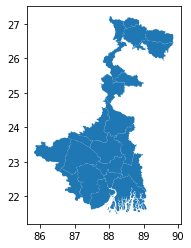

In [ ]:
bengal.plot()

In [ ]:
master_data_wb.at[20, 'District'] = 'Medinipur East'
master_data_wb.at[18, 'District'] = 'Medinipur West'
master_data_wb.at[12, 'District'] = 'Maldah'

In [ ]:
master_data_wb

,Date,State,District,Confirmed,Recovered,Deceased
0,2021-06-20,West Bengal,Alipurduar,13943,13355,95
1,2021-06-20,West Bengal,Bankura,32518,31506,255
2,2021-06-20,West Bengal,Birbhum,39777,39287,277
3,2021-06-20,West Bengal,Cooch Behar,24993,23898,89
4,2021-06-20,West Bengal,Dakshin Dinajpur,16408,15996,165
5,2021-06-20,West Bengal,Darjeeling,49102,46962,437
6,2021-06-20,West Bengal,Hooghly,78935,76699,842
7,2021-06-20,West Bengal,Howrah,92003,89052,1445
8,2021-06-20,West Bengal,Jalpaiguri,37132,35209,477
9,2021-06-20,West Bengal,Jhargram,9741,9253,24


In [ ]:
wb_merged = bengal.set_index('district').join(master_data_wb.set_index('District'))
wb_merged.reset_index(level=0, inplace=True)
wb_merged

,district,id,dt_code,st_nm,st_code,year,geometry,Date,State,Confirmed,Recovered,Deceased
0,South 24 Parganas,None,343,West Bengal,19,2011_c,"MULTIPOLYGON (((88.05086 21.50906, 88.04493 21...",2021-06-20,West Bengal,93410,90646,1224
1,Paschim Medinipur,None,344,West Bengal,19,2011_c,"POLYGON ((87.52298 22.92793, 87.52265 22.91700...",2021-06-20,West Bengal,47134,45488,457
2,Purba Medinipur,None,345,West Bengal,19,2011_c,"POLYGON ((87.43825 21.79078, 87.42572 21.79707...",2021-06-20,West Bengal,57114,54205,355
3,Jhargram,None,776,West Bengal,19,2017_c,"POLYGON ((87.07622 22.72566, 87.07622 22.72566...",2021-06-20,West Bengal,9741,9253,24
4,Darjeeling,None,327,West Bengal,19,2011_c,"POLYGON ((88.41289 27.02563, 88.42212 27.00941...",2021-06-20,West Bengal,49102,46962,437
5,Jalpaiguri,None,328,West Bengal,19,2011_c,"POLYGON ((88.47883 26.87997, 88.51148 26.86309...",2021-06-20,West Bengal,37132,35209,477
6,Dakshin Dinajpur,None,331,West Bengal,19,2011_c,"POLYGON ((88.41981 25.60444, 88.41355 25.59385...",2021-06-20,West Bengal,16408,15996,165
7,Malda,None,332,West Bengal,19,2011_c,"POLYGON ((88.26847 25.30286, 88.28265 25.31676...",2021-06-20,West Bengal,32372,32005,182
8,Murshidabad,None,333,West Bengal,19,2011_c,"POLYGON ((87.96283 24.75266, 88.02745 24.69109...",2021-06-20,West Bengal,33257,32778,317
9,Birbhum,None,334,West Bengal,19,2011_c,"POLYGON ((87.88996 24.55304, 87.88897 24.54344...",2021-06-20,West Bengal,39777,39287,277


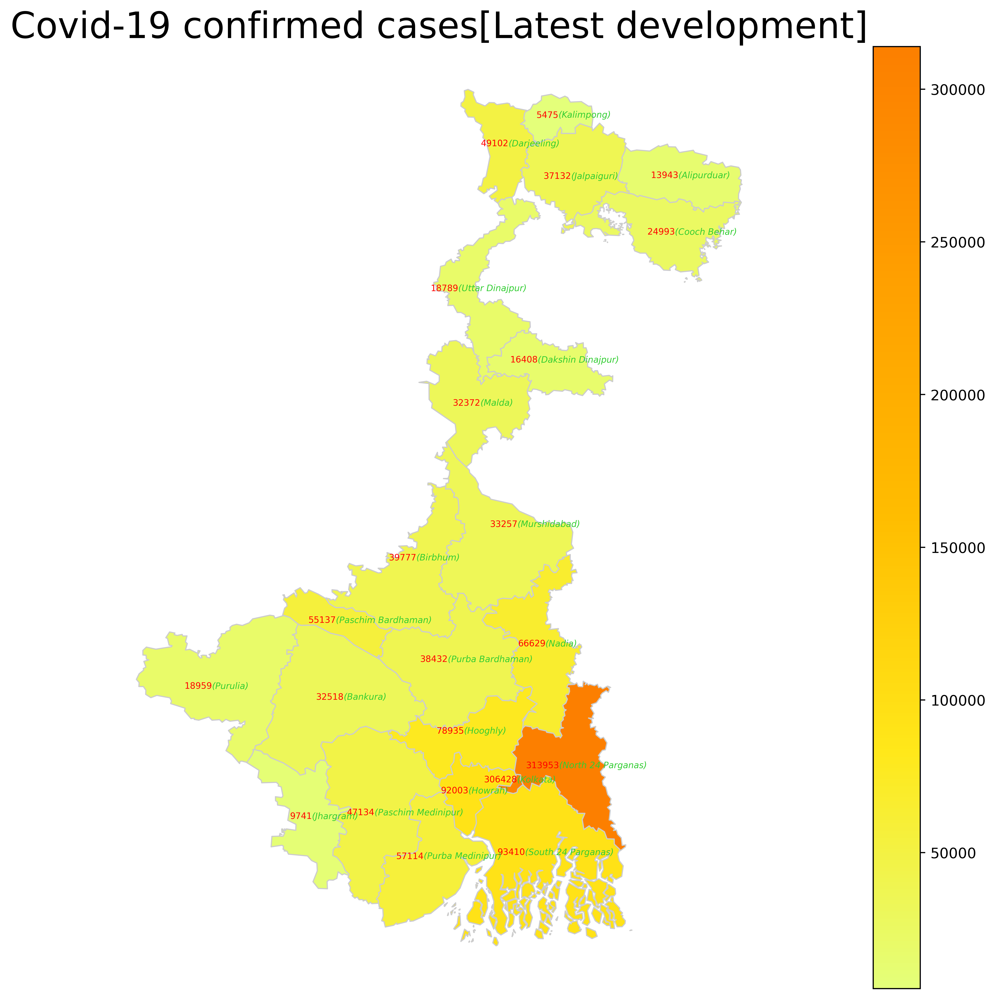

In [ ]:
# create figure and axes for Matplotlib and set the title
fig, ax = plt.subplots(1, figsize=(25, 12),dpi=500)
ax.axis('off')
ax.set_title('Covid-19 confirmed cases[Latest development]', fontdict={'fontsize': '25', 'fontweight' : '3'})
 
# plot the figure
wb_merged.plot(column='Confirmed', cmap='Wistia', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)\
 
#Annotation
wb_merged['coords'] = wb_merged['geometry'].apply(lambda x: x.representative_point().coords[:])
wb_merged['coords'] = [coords[0] for coords in wb_merged['coords']]
 
#merged.plot()
for idx, row in wb_merged.iterrows():
    plt.annotate(s=row['Confirmed'], xy=row['coords'],
                 horizontalalignment='right',color='red',fontsize=6)
    
#merged.plot()
for idx, row in wb_merged.iterrows():
    plt.annotate(s="("+row['district']+")", xy=row['coords'],
                 horizontalalignment='left',color='limegreen',fontsize=6, fontstyle='italic')

In [ ]:
df_vac=pd.read_csv('http://api.covid19india.org/csv/latest/cowin_vaccine_data_districtwise.csv')
df_vac_wb=df_vac[df_vac['State']=='West Bengal'].reset_index(drop=True)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,2

In [ ]:
df_vac_wb

,S No,State_Code,State,District_Key,Cowin Key,District,16/01/2021,16/01/2021.1,16/01/2021.2,16/01/2021.3,16/01/2021.4,16/01/2021.5,16/01/2021.6,16/01/2021.7,16/01/2021.8,16/01/2021.9,17/01/2021,17/01/2021.1,17/01/2021.2,17/01/2021.3,17/01/2021.4,17/01/2021.5,17/01/2021.6,17/01/2021.7,17/01/2021.8,17/01/2021.9,18/01/2021,18/01/2021.1,18/01/2021.2,18/01/2021.3,18/01/2021.4,18/01/2021.5,18/01/2021.6,18/01/2021.7,18/01/2021.8,18/01/2021.9,19/01/2021,19/01/2021.1,19/01/2021.2,19/01/2021.3,...,20/06/2021,20/06/2021.1,20/06/2021.2,20/06/2021.3,20/06/2021.4,20/06/2021.5,20/06/2021.6,20/06/2021.7,20/06/2021.8,20/06/2021.9,Unnamed: 1566,Unnamed: 1567,Unnamed: 1568,Unnamed: 1569,Unnamed: 1570,Unnamed: 1571,Unnamed: 1572,Unnamed: 1573,Unnamed: 1574,Unnamed: 1575,Unnamed: 1576,Unnamed: 1577,Unnamed: 1578,Unnamed: 1579,Unnamed: 1580,Unnamed: 1581,Unnamed: 1582,Unnamed: 1583,Unnamed: 1584,Unnamed: 1585,Unnamed: 1586,Unnamed: 1587,Unnamed: 1588,Unnamed: 1589,Unnamed: 1590,Unnamed: 1591,Unnamed: 1592,Unnamed: 1593,Unnamed: 1594,Unnamed: 1595
0,727.0,WB,West Bengal,WB_Alipurduar,Alipurduar District,Alipurduar,10514,3,3,45,0,18,27,0,0,45,10547,12,4,45,0,18,27,0,0,45,11281,22,4,82,0,24,58,0,0,82,11392,22,4,286,...,245779,2012,7,245779,70310,140873,104861,45,52193,263896,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,728.0,WB,West Bengal,WB_Bankura,Bankura,Bankura,29011,2,2,64,0,18,46,0,0,64,29011,13,6,84,0,26,58,0,0,84,28977,23,6,132,0,40,92,0,0,132,29548,23,6,254,...,319395,3780,11,319395,128035,191868,127504,23,73843,373587,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,729.0,WB,West Bengal,WB_North 24 Parganas,Basirhat HD (North 24 Parganas),North 24 Parganas,9535,2,2,13,0,13,0,0,0,13,9535,8,5,13,0,13,0,0,0,13,9527,16,8,94,0,44,50,0,0,94,9698,24,8,347,...,338644,13756,36,338644,109874,181590,157023,31,58448,390070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,730.0,WB,West Bengal,WB_Birbhum,Birbhum,Birbhum,16959,0,0,6,0,5,1,0,0,6,16960,9,8,7,0,5,2,0,0,7,16946,18,8,65,0,33,32,0,0,65,17083,18,8,247,...,326730,7370,18,326730,95156,179013,147665,52,54212,367674,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,731.0,WB,West Bengal,WB_Bankura,Bishnupur HD (Bankura),Bankura,3113,0,0,0,0,0,0,0,0,0,3115,3,3,0,0,0,0,0,0,0,3116,12,4,163,0,69,94,0,0,163,3117,15,4,195,...,138653,1600,2,138653,46418,83533,55114,6,21395,163676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,732.0,WB,West Bengal,WB_Cooch Behar,COOCHBEHAR,Cooch Behar,14071,9,9,174,0,77,97,0,0,174,14071,25,9,174,0,77,97,0,0,174,14055,54,10,307,0,128,179,0,0,307,14355,61,10,565,...,339215,11086,29,339215,96193,196622,142543,50,49241,386167,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,734.0,WB,West Bengal,WB_Dakshin Dinajpur,Dakshin Dinajpur,Dakshin Dinajpur,15932,6,6,110,0,67,43,0,0,110,15932,13,7,110,0,67,43,0,0,110,15876,22,7,328,0,190,138,0,0,328,16275,37,7,573,...,265351,271,4,265351,87851,141361,123928,62,61070,292132,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,735.0,WB,West Bengal,WB_Darjeeling,Darjeeling,Darjeeling,27458,1,1,59,0,39,20,0,0,59,27459,8,5,59,0,39,20,0,0,59,27573,17,5,230,0,89,141,0,0,230,27948,26,6,449,...,413810,2360,3,413810,126148,220385,193246,179,86332,453626,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,736.0,WB,West Bengal,WB_South 24 Parganas,Diamond Harbor HD (S 24 Parganas),South 24 Parganas,10256,8,8,50,0,26,24,0,0,50,10256,16,8,50,0,26,24,0,0,50,10256,29,8,141,0,77,64,0,

In [ ]:
df_vac_wb1=df_vac_wb['District']
df_vac_wb2=pd.DataFrame(df_vac_wb.iloc[:,-1])
bengal_vac=pd.concat([df_vac_wb1,df_vac_wb2], axis=1)
bengal_vac

,District,Unnamed: 1595
0,Alipurduar,NaN
1,Bankura,NaN
2,North 24 Parganas,NaN
3,Birbhum,NaN
4,Bankura,NaN
5,Cooch Behar,NaN
6,Dakshin Dinajpur,NaN
7,Darjeeling,NaN
8,South 24 Parganas,NaN
9,Purba Bardhaman,NaN


In [ ]:
bengal_vac['19/06/2021.9'].sum()

16572939

In [ ]:
daily_data=pd.read_csv('https://api.covid19india.org/csv/latest/state_wise_daily.csv')

In [ ]:
daily_data

,Date,Date_YMD,Status,TT,AN,AP,AR,AS,BR,CH,CT,DN,DD,DL,GA,GJ,HR,HP,JK,JH,KA,KL,LA,LD,MP,MH,MN,ML,MZ,NL,OR,PY,PB,RJ,SK,TN,TG,TR,UP,UT,WB,UN
0,14-Mar-20,2020-03-14,Confirmed,81,0,1,0,0,0,0,0,0,0,7,0,0,14,0,2,0,6,19,0,0,0,14,0,0,0,0,0,0,1,3,0,1,1,0,12,0,0,0
1,14-Mar-20,2020-03-14,Recovered,9,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,4,0,0,0
2,14-Mar-20,2020-03-14,Deceased,2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,15-Mar-20,2020-03-15,Confirmed,27,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,18,0,0,0,0,0,0,0,1,0,0,2,0,1,0,0,0
4,15-Mar-20,2020-03-15,Recovered,4,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1360,10-Jun-21,2021-06-10,Recovered,135329,21,12981,302,5123,985,132,1858,15,0,560,584,1505,1221,862,2363,557,15721,17994,160,137,1132,11449,668,427,213,117,8299,646,2337,2268,113,32049,2524,363,1231,3242,5170,0
1361,10-Jun-21,2021-06-10,Deceased,3414,0,67,5,51,23,2,14,0,0,44,14,11,32,17,25,5,194,194,2,0,34,1915,10,10,3,6,44,9,74,23,3,358,14,14,81,29,87,0
1362,11-Jun-21,2021-06-11,Confirmed,84574,36,8239,358,3666,566,70,741,8,0,238,423,481,463,505,906,291,8249,14233,31,49,397,11766,687,514,210,116,5235,429,1201,446,147,15759,1707,641,596,287,4883,0
1363,11-Jun-21,2021-06-11,Recovered,122685,11,11135,288,5241,1099,84,2069,20,0,504,819,1526,1036,957,1885,584,14973,15355,88,104,1240,8104,1105,526,254,209,8516,967,2071,1475,277,29243,2493,850,1642,1614,4321,0


In [ ]:
daily_=daily_data[daily_data["Status"]=="Confirmed"]

In [ ]:
daily_

,Date,Date_YMD,Status,TT,AN,AP,AR,AS,BR,CH,CT,DN,DD,DL,GA,GJ,HR,HP,JK,JH,KA,KL,LA,LD,MP,MH,MN,ML,MZ,NL,OR,PY,PB,RJ,SK,TN,TG,TR,UP,UT,WB,UN
0,14-Mar-20,2020-03-14,Confirmed,81,0,1,0,0,0,0,0,0,0,7,0,0,14,0,2,0,6,19,0,0,0,14,0,0,0,0,0,0,1,3,0,1,1,0,12,0,0,0
3,15-Mar-20,2020-03-15,Confirmed,27,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,18,0,0,0,0,0,0,0,1,0,0,2,0,1,0,0,0
6,16-Mar-20,2020-03-16,Confirmed,15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,3,0,0,0,6,0,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0
9,17-Mar-20,2020-03-17,Confirmed,11,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,2,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,1,0,2,0,1,0
12,18-Mar-20,2020-03-18,Confirmed,37,0,0,0,0,0,0,0,0,0,2,0,0,1,0,1,0,5,0,8,0,0,3,0,0,0,0,1,0,1,3,0,1,8,0,2,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1350,07-Jun-21,2021-06-07,Confirmed,85804,12,4872,360,3804,762,48,1285,1,0,231,418,778,640,656,977,358,11958,9313,61,38,571,10219,598,438,112,145,6118,482,1269,629,59,19448,1933,235,694,395,5887,0
1353,08-Jun-21,2021-06-08,Confirmed,92787,23,7796,304,3948,711,71,1102,8,0,316,473,695,635,596,1184,603,9808,15567,72,99,535,10891,748,379,315,133,5896,545,1252,529,255,18023,1897,700,705,546,5427,0
1356,09-Jun-21,2021-06-09,Confirmed,93883,14,8766,247,3751,589,84,954,11,0,337,456,644,528,554,1098,302,10959,16204,55,128,453,10989,775,448,202,186,6019,642,1393,520,231,17321,1813,625,688,513,5384,0
1359,10-Jun-21,2021-06-10,Confirmed,91849,29,8110,245,3756,551,66,1034,10,0,305,413,544,539,533,1117,293,11042,14424,90,71,420,12207,730,603,337,113,6097,507,1311,538,287,16813,1798,658,596,388,5274,0


In [ ]:
daily_compare=daily_[['Date_YMD','Status','WB', "MH","DL","KL","UP"]]

In [ ]:
daily_compare

,Date_YMD,Status,WB,MH,DL,KL,UP
0,2020-03-14,Confirmed,0,14,7,19,12
3,2020-03-15,Confirmed,0,18,0,5,1
6,2020-03-16,Confirmed,0,6,0,3,0
9,2020-03-17,Confirmed,1,3,1,0,2
12,2020-03-18,Confirmed,0,3,2,0,2
...,...,...,...,...,...,...,...
1350,2021-06-07,Confirmed,5887,10219,231,9313,694
1353,2021-06-08,Confirmed,5427,10891,316,15567,705
1356,2021-06-09,Confirmed,5384,10989,337,16204,688
1359,2021-06-10,Confirmed,5274,12207,305,14424,596


In [ ]:
fig = px.bar(daily_compare, x="Date_YMD", y="WB", color="Status",
   animation_group='Status',animation_frame="Date_YMD",range_y=[0,10000])
fig.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as ani
import matplotlib
matplotlib.get_backend()

'module://ipykernel.pylab.backend_inline'

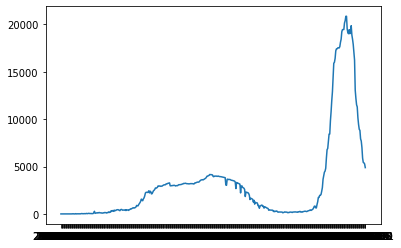

In [ ]:
plt.plot(daily_compare['Date_YMD'],daily_compare['WB'])


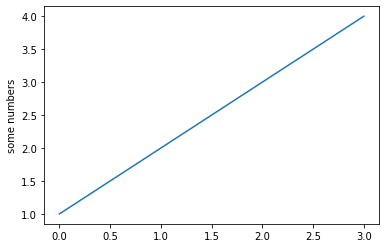

In [ ]:
import matplotlib.pyplot as plt
plt.plot([1,2,3,4])
plt.ylabel('some numbers')
plt.show()

# Bar chart race

In [ ]:
column=daily_.columns
column

Index(['Date', 'Date_YMD', 'Status', 'TT', 'AN', 'AP', 'AR', 'AS', 'BR', 'CH',
       'CT', 'DN', 'DD', 'DL', 'GA', 'GJ', 'HR', 'HP', 'JK', 'JH', 'KA', 'KL',
       'LA', 'LD', 'MP', 'MH', 'MN', 'ML', 'MZ', 'NL', 'OR', 'PY', 'PB', 'RJ',
       'SK', 'TN', 'TG', 'TR', 'UP', 'UT', 'WB', 'UN'],
      dtype='object')

In [ ]:
columns=['Date_YMD', 'TT', 'AN', 'AP', 'AR', 'AS', 'BR', 'CH',
       'CT', 'DN', 'DL', 'GA', 'GJ', 'HR', 'HP', 'JK', 'JH', 'KA', 'KL',
       'LA', 'LD', 'MP', 'MH', 'MN', 'ML', 'MZ', 'NL', 'OR', 'PY', 'PB', 'RJ',
       'SK', 'TN', 'TG', 'TR', 'UP', 'UT', 'WB']

In [ ]:
master_df=daily_[columns]
master_df.set_index('Date_YMD', inplace=True)
master_cumsum=master_df.cumsum(axis=0)
master_cumsum.tail(10)

,TT,AN,AP,AR,AS,BR,CH,CT,DN,DL,GA,GJ,HR,HP,JK,JH,KA,KL,LA,LD,MP,MH,MN,ML,MZ,NL,OR,PY,PB,RJ,SK,TN,TG,TR,UP,UT,WB
Date_YMD,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-06-02,28440221,7039,1717156,28019,419974,709093,60288,975141,10190,1427439,157275,812062,759039,192142,294078,338889,2635122,2566001,18841,8335,782099,5776184,52272,36549,12634,22035,782131,106301,571970,942236,15890,2148346,582718,52542,1693992,331478,1394724
2021-06-03,28572645,7066,1728577,28383,424283,710199,60399,976760,10217,1427926,157847,813269,760019,193137,295879,339904,2653446,2584854,18954,8479,782945,5791413,52893,37101,12859,22203,790970,107116,574114,943494,16179,2172751,584979,53219,1695212,332067,1403535
2021-06-04,28693099,7084,1738990,28787,428831,711190,60487,978220,10264,1428449,158423,814389,760914,193924,297602,340382,2669514,2601083,19076,8568,783743,5805565,53684,37685,13064,22350,798699,107828,576119,944500,16532,2195402,587154,53869,1696324,332959,1411448
2021-06-05,28807587,7101,1749363,29114,432612,712197,60585,979576,10278,1428863,158990,815385,761637,194742,299050,340899,2683314,2618411,19147,8667,784461,5819224,54401,38182,13300,22659,806094,108441,577997,945442,16785,2216812,589224,54577,1697352,333578,1419130
2021-06-06,28908796,7115,1758339,29337,434840,713117,60659,980575,10284,1429244,159393,816233,762291,195099,300490,341192,2695523,2633083,19197,8737,785196,5831781,55224,38670,13567,22736,813096,109081,579560,946346,17125,2237233,590660,55231,1698389,334024,1426132
2021-06-07,28994600,7127,1763211,29697,438644,713879,60707,981860,10285,1429475,159811,817011,762931,195755,301467,341550,2707481,2642396,19258,8775,785767,5842000,55822,39108,13679,22881,819214,109563,580829,946975,17184,2256681,592593,55466,1699083,334419,1432019
2021-06-08,29087387,7150,1771007,30001,442592,714590,60778,982962,10293,1429791,160284,817706,763566,196351,302651,342153,2717289,2657963,19330,8874,786302,5852891,56570,39487,13994,23014,825110,110108,582081,947504,17439,2274704,594490,56166,1699788,334965,1437446
2021-06-09,29181270,7164,1779773,30248,446343,715179,60862,983916,10304,1430128,160740,818350,764094,196905,303749,342455,2728248,2674167,19385,9002,786755,5863880,57345,39935,14196,23200,831129,110750,583474,948024,17670,2292025,596303,56791,1700476,335478,1442830
2021-06-10,29273119,7193,1787883,30493,450099,715730,60928,984950,10314,1430433,161153,818894,764633,197438,304866,342748,2739290,2688591,19475,9073,787175,5876087,58075,40538,14533,23313,837226,111257,584785,948562,17957,2308838,598101,57449,1701072,335866,1448104


In [ ]:
!pip install bar_chart_race

     |████████████████████████████████| 163kB 6.4MB/s 


In [ ]:
import bar_chart_race as bcr

In [ ]:
bcr.bar_chart_race(df=master_cumsum, filename=None, figsize=(6,4), title="COVID-19 CUMULATIVE CONFIRMED CASES IN INDIA")

Animation movie is 21455747 bytes, exceeding the limit of 20971520.0. If you're sure you want a large animation embedded, set the animation.embed_limit rc parameter to a larger value (in MB).


# Labs

In [ ]:
labs=pd.read_csv("https://api.covid19india.org/csv/latest/icmr_labs_statewise.csv")

In [ ]:
labs

,Unnamed: 0,Unnamed: 1,Andaman and Nicobar Islands,Unnamed: 3,Andhra Pradesh,Unnamed: 5,Arunachal Pradesh,Unnamed: 7,Assam,Unnamed: 9,Bihar,Unnamed: 11,Chandigarh,Unnamed: 13,Chhattisgarh,Unnamed: 15,Dadra & Nagar Haveli,Unnamed: 17,Delhi,Unnamed: 19,Goa,Unnamed: 21,Gujarat,Unnamed: 23,Haryana,Unnamed: 25,Himachal Pradesh,Unnamed: 27,Jammu and Kashmir,Unnamed: 29,Jharkhand,Unnamed: 31,Karnataka,Unnamed: 33,Kerala,Unnamed: 35,Ladakh,Unnamed: 37,Lakshwadeep,Unnamed: 39,...,Maharashtra,Unnamed: 43,Manipur,Unnamed: 45,Meghalaya,Unnamed: 47,Mizoram,Unnamed: 49,Nagaland,Unnamed: 51,Odisha,Unnamed: 53,Puducherry,Unnamed: 55,Punjab,Unnamed: 57,Rajasthan,Unnamed: 59,Sikkim,Unnamed: 61,Tamil Nadu,Unnamed: 63,Telanagana,Unnamed: 65,Tripura,Unnamed: 67,Uttar Pradesh,Unnamed: 69,Uttarakhand,Unnamed: 71,West Bengal,Unnamed: 73,Mobile Vans,Unnamed: 75,Duplicates,Unnamed: 77,Total,Unnamed: 79,Changes,Unnamed: 81
0,NaN,NaN,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,...,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private,Govt,Private
1,04/05/2020,RT-PCR,1,0,10,0,1,0,7,0,6,0,3,0,4,0,1,0,11,13,1,0,13,8,8,7,5,0,4,0,4,1,16,7,14,5,0,0,0,0,...,31,20,2,0,1,0,1,0,0,0,7,1,2,0,3,1,17,3,0,0,36,13,9,11,1,0,20,3,4,1,10,4,0,0,NaN,NaN,263,101,-,-
2,NaN,TrueNat,1,0,38,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,44,0,-,-
3,NaN,CBNAAT,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,2,0,0,0,0,0,0,0,4,2,0,1,0,0,0,0,...,3,4,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1,2,0,0,NaN,NaN,13,13,-,-
4,11/05/2020,RT-PCR,1,0,10,0,1,0,7,0,6,0,3,0,4,0,1,0,12,14,1,0,16,11,8,7,5,0,5,0,4,1,17,11,14,5,0,0,0,0,...,33,22,2,0,3,0,1,0,0,0,7,1,2,0,3,2,17,3,0,0,38,15,8,11,1,0,22,4,4,1,11,7,0,0,-1,NaN,278,119,15,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,NaN,TrueNat,2,0,62,1,16,2,3,23,38,1,4,0,29,6,0,0,3,8,5,1,14,5,3,8,22,1,11,3,25,0,14,10,10,36,0,0,2,0,...,19,7,4,4,12,2,10,0,11,0,30,2,1,0,25,6,0,5,1,0,11,36,0,1,2,0,77,48,33,1,43,14,0,0,1,NaN,601,239,5,6
84,NaN,CBNAAT,2,0,0,1,0,0,0,1,0,3,0,0,0,0,0,0,3,5,0,0,2,7,2,0,0,0,2,0,1,1,0,7,2,12,0,0,0,0,...,7,16,0,1,0,1,0,0,0,0,0,0,2,0,2,5,0,1,0,0,1,11,6,3,0,0,2,8,1,0,0,8,0,0,NaN,1,35,93,0,-1
85,16/11/2020,RT-PCR,1,0,16,33,1,0,12,4,10,11,3,1,7,3,1,0,21,41,1,0,23,27,17,19,8,1,11,0,7,7,44,88,24,35,4,0,0,0,...,65,83,3,1,3,0,1,0,3,0,13,9,3,7,9,7,36,15,1,0,54,98,14,60,2,0,44,33,8,4,24,20,0,0,-1,-1,512,619,6,13
86,NaN,TrueNat,2,0,62,1,20,2,3,23,38,1,4,0,29,6,0,0,3,14,5,1,14,5,3,8,22,1,11,3,25,0,14,10,10,39,0,0,2,0,...,19,7,4,5,12,2,10,0,11,0,30,2,1,0,25,6,0,5,1,0,11,37,0,1,2,0,78,47,33,1,43,13,0,0,1,-5,606,244,5,5


In [ ]:
vaccine=pd.read_csv('http://api.covid19india.org/csv/latest/vaccine_doses_statewise.csv')

In [ ]:
vaccine.head()

,State,16/01/2021,18/01/2021,19/01/2021,20/01/2021,21/01/2021,22/01/2021,23/01/2021,24/01/2021,25/01/2021,26/01/2021,27/01/2021,28/01/2021,29/01/2021,30/01/2021,31/01/2021,01/02/2021,02/02/2021,03/02/2021,04/02/2021,05/02/2021,06/02/2021,07/02/2021,08/02/2021,09/02/2021,10/02/2021,11/02/2021,12/02/2021,13/02/2021,14/02/2021,15/02/2021,16/02/2021,17/02/2021,18/02/2021,19/02/2021,20/02/2021,21/02/2021,22/02/2021,23/02/2021,24/02/2021,...,11/05/2021,12/05/2021,13/05/2021,14/05/2021,15/05/2021,16/05/2021,17/05/2021,18/05/2021,19/05/2021,20/05/2021,21/05/2021,22/05/2021,23/05/2021,24/05/2021,25/05/2021,26/05/2021,27/05/2021,28/05/2021,29/05/2021,30/05/2021,31/05/2021,01/06/2021,02/06/2021,03/06/2021,04/06/2021,05/06/2021,06/06/2021,07/06/2021,08/06/2021,09/06/2021,10/06/2021,11/06/2021,12/06/2021,13/06/2021,14/06/2021,15/06/2021,16/06/2021,17/06/2021,18/06/2021,19/06/2021
0,Andaman and Nicobar Islands,225,442,644,644,1032,1466,1998,2019,2369,2369,2385,2656,2727,2727,2727,2727,2727,2772,2938,3161,3161,3397,3397,3413,3413,3454,3454,3646,3646,4029,4029,4227,4842,5348,6152,6152,7312,7583,7762,...,112230,112809,113446,113455,113994,114006,114440,114721,115236,117175,117943,118754,119139,119590,120277,121086,121700,122463,123480,123722,124265,125001,125504,126195,126704,127183,127191,127726,128151,128483,129383,130148,131034,131036,131992,132923,133906,134868,135816,136693
1,Andhra Pradesh,18412,46680,58495,91778,115365,133298,147030,147030,156120,156129,163727,171683,179038,187252,187252,187252,187252,215171,243243,272190,299649,299649,314316,325538,335268,343813,351993,362341,362341,376444,390665,411783,438766,469815,493471,503323,529820,556810,592903,...,7340481,7373521,7413446,7428976,7502525,7513031,7569446,7629580,7660595,7857020,7888256,7905740,7915178,8023541,8156085,8459763,9040640,9488593,9751848,9766778,9863347,10073383,10225904,10337846,10696049,10788005,10852057,10992317,11037411,11224580,11480538,11676594,11850826,11929606,12304416,12388392,12420070,12442374,12465114,12493328
2,Arunachal Pradesh,829,2805,2805,3023,4682,5956,6511,6511,7307,7307,7307,8656,9265,9651,9651,9791,9791,9846,10889,11834,12346,12346,13479,13480,13480,14322,15098,16094,16094,18187,18187,18187,21300,23559,23743,23743,26650,27916,27930,...,287203,289133,291703,293227,294841,295256,300773,306421,311599,318092,321285,323149,323976,327007,328545,329357,330302,331475,332657,332991,333918,336544,343230,351336,362881,372699,376678,384590,389896,395696,400506,405424,410427,414576,420878,426146,439044,453756,469078,478056
3,Assam,3528,5542,7418,7585,10676,13881,13881,13881,19837,19837,19945,28918,36932,38106,38106,39724,42435,43607,60556,77225,87269,88585,99889,108887,110977,117607,125038,129781,129873,132475,135419,137224,146748,157532,164309,165804,179102,190374,195420,...,3178021,3213306,3258291,3283170,3339022,3378305,3448259,3507586,3544861,3620118,3665033,3714758,3753286,3830062,3898903,3934911,3981565,4027312,4073698,4093697,4137301,4174248,4199011,4235135,4273647,4314250,4338299,4387924,4449008,4490118,4582985,4671194,4754657,4806482,4888213,4946819,4992743,5083878,5201172,5319506
4,Bihar,18169,33389,42085,47433,63541,63620,76125,76125,88450,88450,89074,107174,110396,146015,148293,184215,222153,264097,312339,354360,374538,380229,397555,415989,430307,448903,471683,491233,492152,509026,510485,518095,540107,550433,561343,561857,582950,592457,600795,...,8155618,8266897,8412634,8549713,8698695,8824306,8936921,9013570,9068070,9363116,9458666,9516740,9679108,9865884,9986557,10063930,10116193,10151005,10203344,10244836,10305969,10363135,10419429,10583676,10768582,10916300,11022005,11124175,11218366,11403526,11592170,11769400,11926619,12018966,12125672,12195216,12710936,12966370,13154337,13500283


In [ ]:
df=vaccine.T

In [ ]:
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37
State,Andaman and Nicobar Islands,Andhra Pradesh,Arunachal Pradesh,Assam,Bihar,Chandigarh,Chhattisgarh,Dadra and Nagar Haveli and Daman and Diu,Delhi,Goa,Gujarat,Haryana,Himachal Pradesh,Jammu and Kashmir,Jharkhand,Karnataka,Kerala,Ladakh,Lakshadweep,Madhya Pradesh,Maharashtra,Manipur,Meghalaya,Mizoram,Nagaland,Odisha,Puducherry,Punjab,Rajasthan,Sikkim,Tamil Nadu,Telangana,Tripura,Uttar Pradesh,Uttarakhand,West Bengal,Miscellaneous,Total
16/01/2021,225,18412,829,3528,18169,265,5592,123,4319,426,10787,5589,1517,2044,3096,13594,8062,79,21,9219,18328,585,509,314,561,13746,274,1319,9279,120,2945,3653,355,21291,2276,9730,0,191181
18/01/2021,442,46680,2805,5542,33389,265,10872,123,7968,426,10787,17642,4817,3375,6059,66392,15477,119,201,18174,18582,978,530,554,1436,46506,554,3318,23546,120,16462,17408,1736,22644,4237,29866,14017,454049
19/01/2021,644,58495,2805,7418,42085,469,10872,208,12441,426,17581,24944,5049,4395,8824,80686,23855,119,369,18174,30247,111,1037,1091,2286,55138,719,5567,30761,350,25251,69405,3734,22644,6107,42093,14017,630417
20/01/2021,644,91778,3023,7585,47433,469,16255,219,12902,426,21832,30402,5094,4414,11641,121466,24269,240,369,27770,52055,1454,1365,1508,2988,68743,759,7607,32379,573,33670,69405,3734,22644,6119,46310,26940,806484
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19/04/2021,83085,4756984,180287,1677769,5838127,149987,5043710,84945,2682165,253784,10620832,3163013,1328663,1688397,2807893,7543325,6026805,80595,18482,7507451,12650266,157711,174713,164833,148681,5072765,168672,2508073,11192119,166609,4814662,3132747,910346,10909765,1628191,8976743,2815918,127129113
20/04/2021,86926,4927736,186071,1771560,5965675,154584,5102952,86395,2732522,264363,10807438,3242458,1378686,1753277,2849025,7768994,6243833,84637,19011,7542949,12945000,162117,180632,174379,155195,5194381,170810,2595020,11451137,171142,4892488,3272989,934015,11120780,1678639,9211156,2840338,130119310
21/04/2021,89072,4968504,190500,1825312,6057811,158565,5146710,87079,2787132,272843,10938424,3287861,1400847,1801471,2877574,7958245,6353754,88453,19786,7566383,13279970,167554,185239,180829,162418,5306252,173769,2658091,11650301,172465,4965949,3395125,941698,11259746,1715839,9396277,2842796,132330644
22/04/2021,91977,5330080,197578,1900839,6171493,163872,5213264,88091,2855750,281429,11099586,3345415,1451370,1856995,2902019,8191052,6504117,91310,20206,7738469,13675149,171785,194776,194136,169219,5399333,176558,2715479,11836328,177160,5076978,3606921,953744,11441728,1767551,9558932,2867731,135478420


In [ ]:
df.columns = df.iloc[0]

In [ ]:
df=df[1:]

In [ ]:
df

State,Andaman and Nicobar Islands,Andhra Pradesh,Arunachal Pradesh,Assam,Bihar,Chandigarh,Chhattisgarh,Dadra and Nagar Haveli and Daman and Diu,Delhi,Goa,Gujarat,Haryana,Himachal Pradesh,Jammu and Kashmir,Jharkhand,Karnataka,Kerala,Ladakh,Lakshadweep,Madhya Pradesh,Maharashtra,Manipur,Meghalaya,Mizoram,Nagaland,Odisha,Puducherry,Punjab,Rajasthan,Sikkim,Tamil Nadu,Telangana,Tripura,Uttar Pradesh,Uttarakhand,West Bengal,Miscellaneous,Total
16/01/2021,225,18412,829,3528,18169,265,5592,123,4319,426,10787,5589,1517,2044,3096,13594,8062,79,21,9219,18328,585,509,314,561,13746,274,1319,9279,120,2945,3653,355,21291,2276,9730,0,191181
18/01/2021,442,46680,2805,5542,33389,265,10872,123,7968,426,10787,17642,4817,3375,6059,66392,15477,119,201,18174,18582,978,530,554,1436,46506,554,3318,23546,120,16462,17408,1736,22644,4237,29866,14017,454049
19/01/2021,644,58495,2805,7418,42085,469,10872,208,12441,426,17581,24944,5049,4395,8824,80686,23855,119,369,18174,30247,111,1037,1091,2286,55138,719,5567,30761,350,25251,69405,3734,22644,6107,42093,14017,630417
20/01/2021,644,91778,3023,7585,47433,469,16255,219,12902,426,21832,30402,5094,4414,11641,121466,24269,240,369,27770,52055,1454,1365,1508,2988,68743,759,7607,32379,573,33670,69405,3734,22644,6119,46310,26940,806484
21/01/2021,1032,115365,4682,10676,63541,753,22171,278,18844,426,34865,45893,5790,6847,11641,138807,35173,240,369,38278,52393,1454,1785,2537,3187,113623,759,12532,32379,773,42947,97087,9272,22644,8206,53988,32297,1043534
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19/04/2021,83085,4756984,180287,1677769,5838127,149987,5043710,84945,2682165,253784,10620832,3163013,1328663,1688397,2807893,7543325,6026805,80595,18482,7507451,12650266,157711,174713,164833,148681,5072765,168672,2508073,11192119,166609,4814662,3132747,910346,10909765,1628191,8976743,2815918,127129113
20/04/2021,86926,4927736,186071,1771560,5965675,154584,5102952,86395,2732522,264363,10807438,3242458,1378686,1753277,2849025,7768994,6243833,84637,19011,7542949,12945000,162117,180632,174379,155195,5194381,170810,2595020,11451137,171142,4892488,3272989,934015,11120780,1678639,9211156,2840338,130119310
21/04/2021,89072,4968504,190500,1825312,6057811,158565,5146710,87079,2787132,272843,10938424,3287861,1400847,1801471,2877574,7958245,6353754,88453,19786,7566383,13279970,167554,185239,180829,162418,5306252,173769,2658091,11650301,172465,4965949,3395125,941698,11259746,1715839,9396277,2842796,132330644
22/04/2021,91977,5330080,197578,1900839,6171493,163872,5213264,88091,2855750,281429,11099586,3345415,1451370,1856995,2902019,8191052,6504117,91310,20206,7738469,13675149,171785,194776,194136,169219,5399333,176558,2715479,11836328,177160,5076978,3606921,953744,11441728,1767551,9558932,2867731,135478420


Index(['16/01/2021', '18/01/2021', '19/01/2021', '20/01/2021', '21/01/2021',
       '22/01/2021', '23/01/2021', '24/01/2021', '25/01/2021', '26/01/2021',
       '27/01/2021', '28/01/2021', '29/01/2021', '30/01/2021', '31/01/2021',
       '01/02/2021', '02/02/2021', '03/02/2021', '04/02/2021', '05/02/2021',
       '06/02/2021', '07/02/2021', '08/02/2021', '09/02/2021', '10/02/2021',
       '11/02/2021', '12/02/2021', '13/02/2021', '14/02/2021', '15/02/2021',
       '16/02/2021', '17/02/2021', '18/02/2021', '19/02/2021', '20/02/2021',
       '21/02/2021', '22/02/2021', '23/02/2021', '24/02/2021', '25/02/2021',
       '26/02/2021', '27/02/2021', '28/02/2021', '01/03/2021', '02/03/2021',
       '03/03/2021', '04/03/2021', '05/03/2021', '06/03/2021', '07/03/2021',
       '08/03/2021', '09/03/2021', '10/03/2021', '11/03/2021', '12/03/2021',
       '13/03/2021', '14/03/2021', '15/03/2021', '16/03/2021', '17/03/2021',
       '18/03/2021', '19/03/2021', '20/03/2021', '21/03/2021', '22/03/2021',

In [ ]:

master_cumsum_vac=df.cumsum(axis=0)
master_cumsum_vac.tail(10)

State,Andaman and Nicobar Islands,Andhra Pradesh,Arunachal Pradesh,Assam,Bihar,Chandigarh,Chhattisgarh,Dadra and Nagar Haveli and Daman and Diu,Delhi,Goa,Gujarat,Haryana,Himachal Pradesh,Jammu and Kashmir,Jharkhand,Karnataka,Kerala,Ladakh,Lakshadweep,Madhya Pradesh,Maharashtra,Manipur,Meghalaya,Mizoram,Nagaland,Odisha,Puducherry,Punjab,Rajasthan,Sikkim,Tamil Nadu,Telangana,Tripura,Uttar Pradesh,Uttarakhand,West Bengal,Miscellaneous,Total
14/04/2021,1.10503e+06,1.05222e+08,4.19621e+06,4.19112e+07,1.20813e+08,3.41931e+06,9.13713e+07,1.51698e+06,5.81983e+07,4.79706e+06,2.30039e+08,6.06577e+07,2.34965e+07,3.57098e+07,6.03239e+07,1.53942e+08,1.30263e+08,2.07168e+06,362344,1.4661e+08,2.5358e+08,5.36524e+06,4.41893e+06,3.36698e+06,3.72836e+06,1.0872e+08,2.7484e+06,3.91864e+07,2.42829e+08,3.24717e+06,1.08264e+08,5.94758e+07,2.2576e+07,2.38964e+08,3.19213e+07,2.08467e+08,8.78426e+07,2.70073e+09
15/04/2021,1.16593e+06,1.09819e+08,4.35749e+06,4.34666e+07,1.26169e+08,3.55388e+06,9.60519e+07,1.59642e+06,6.06532e+07,5.0102e+06,2.40068e+08,6.3533e+07,2.4689e+07,3.72105e+07,6.29651e+07,1.60647e+08,1.3576e+08,2.14816e+06,378488,1.53669e+08,2.65092e+08,5.51073e+06,4.5822e+06,3.50256e+06,3.86141e+06,1.13406e+08,2.89679e+06,4.13525e+07,2.53189e+08,3.39573e+06,1.12587e+08,6.20984e+07,2.34213e+07,2.49238e+08,3.33883e+07,2.16936e+08,9.05794e+07,2.81795e+09
16/04/2021,1.23366e+06,1.14423e+08,4.52421e+06,4.50311e+07,1.31597e+08,3.69302e+06,1.00802e+08,1.6779e+06,6.31573e+07,5.23519e+06,2.50233e+08,6.64908e+07,2.59306e+07,3.87552e+07,6.56472e+07,1.67558e+08,1.41442e+08,2.22512e+06,395074,1.60785e+08,2.76979e+08,5.65936e+06,4.74975e+06,3.65064e+06,3.99905e+06,1.18201e+08,3.05428e+06,4.36141e+07,2.63713e+08,3.55102e+06,1.1712e+08,6.49008e+07,2.4284e+07,2.59777e+08,3.49074e+07,2.25545e+08,9.3347e+07,2.93789e+09
17/04/2021,1.30777e+06,1.19031e+08,4.69515e+06,4.66176e+07,1.37177e+08,3.83628e+06,1.05673e+08,1.76104e+06,6.573e+07,5.47234e+06,2.60571e+08,6.95137e+07,2.72087e+07,4.03444e+07,6.83814e+07,1.7475e+08,1.47275e+08,2.30294e+06,412325,1.6809e+08,2.89119e+08,5.8115e+06,4.91923e+06,3.80468e+06,4.1381e+06,1.23066e+08,3.21805e+06,4.59666e+07,2.74411e+08,3.71115e+06,1.21791e+08,6.78537e+07,2.51644e+07,2.70489e+08,3.64728e+07,2.34285e+08,9.61393e+07,3.06051e+09
18/04/2021,1.38601e+06,1.23644e+08,4.86782e+06,4.82151e+07,1.42865e+08,3.98188e+06,1.1063e+08,1.84472e+06,6.83513e+07,5.71692e+06,2.71022e+08,7.258e+07,2.84982e+07,4.19666e+07,7.11568e+07,1.82047e+08,1.53145e+08,2.3808e+06,430549,1.7542e+08,3.01393e+08,5.96462e+06,5.08881e+06,3.95886e+06,4.2782e+06,1.27997e+08,3.38369e+06,4.83847e+07,2.85296e+08,3.87220e+06,1.26503e+08,7.0814e+07,2.60505e+07,2.81208e+08,3.8041e+07,2.43049e+08,9.89329e+07,3.18436e+09
19/04/2021,1.46909e+06,1.28401e+08,5.04811e+06,4.98929e+07,1.48703e+08,4.13186e+06,1.15673e+08,1.92966e+06,7.10335e+07,5.97070e+06,2.81643e+08,7.57431e+07,2.98269e+07,4.3655e+07,7.39647e+07,1.89591e+08,1.59172e+08,2.4614e+06,449031,1.82927e+08,3.14043e+08,6.12233e+06,5.26352e+06,4.12369e+06,4.42688e+06,1.3307e+08,3.55237e+06,5.08928e+07,2.96488e+08,4.03881e+06,1.31317e+08,7.39468e+07,2.69608e+07,2.92118e+08,3.96692e+07,2.52026e+08,1.01749e+08,3.31149e+09
20/04/2021,1.55602e+06,1.33329e+08,5.23418e+06,5.16644e+07,1.54668e+08,4.28645e+06,1.20776e+08,2.01606e+06,7.3766e+07,6.23507e+06,2.9245e+08,7.89855e+07,3.12056e+07,4.54083e+07,7.68137e+07,1.9736e+08,1.65415e+08,2.54603e+06,468042,1.9047e+08,3.26988e+08,6.28445e+06,5.44415e+06,4.29807e+06,4.58208e+06,1.38264e+08,3.72318e+06,5.34878e+07,3.0794e+08,4.20996e+06,1.3621e+08,7.72197e+07,2.78949e+07,3.03238e+08,4.13478e+07,2.61237e+08,1.04589e+08,3.44161e+09
21/04/2021,1.64509e+06,1.38297e+08,5.42468e+06,5.34897e+07,1.60726e+08,4.44501e+06,1.25923e+08,2.10314e+06,7.65531e+07,6.50791e+06,3.03389e+08,8.22734e+07,3.26064e+07,4.72097e+07,7.96913e+07,2.05318e+08,1.71769e+08,2.63448e+06,487828,1.98037e+08,3.40268e+08,6.452e+06,5.62939e+06,4.4789e+06,4.7445e+06,1.4357e+08,3.89694e+06,5.61459e+07,3.1959e+08,4.38242e+06,1

In [ ]:
from pandas.api.types import is_string_dtype
from pandas.api.types import is_numeric_dtype

is_string_dtype(master_cumsum_vac['Andhra Pradesh'])


True

In [ ]:
master_cumsum_vac = master_cumsum_vac.apply(pd.to_numeric)

In [ ]:
bcr.bar_chart_race(df=master_cumsum_vac, filename=None, figsize=(6,4), title="COVID-19 VACCINES IN INDIA")

In [ ]:
covid_world=pd.read_csv("https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv"
                        ,sep=',')

In [ ]:
#covid_world=covid_world.sort_values(by='date')
covid_world=covid_world.fillna(0)

In [ ]:
covid_asia=covid_world[covid_world['continent']=='Asia']
covid_asia.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,new_vaccinations_smoothed_per_million,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality
0,AFG,Asia,Afghanistan,2020-02-24,1.0,1.0,0.0,0.0,0.0,0.0,0.026,0.026,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,0.0,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511,0.0
1,AFG,Asia,Afghanistan,2020-02-25,1.0,0.0,0.0,0.0,0.0,0.0,0.026,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,0.0,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511,0.0
2,AFG,Asia,Afghanistan,2020-02-26,1.0,0.0,0.0,0.0,0.0,0.0,0.026,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,0.0,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511,0.0
3,AFG,Asia,Afghanistan,2020-02-27,1.0,0.0,0.0,0.0,0.0,0.0,0.026,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,0.0,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511,0.0
4,AFG,Asia,Afghanistan,2020-02-28,1.0,0.0,0.0,0.0,0.0,0.0,0.026,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,0.0,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511,0.0


In [ ]:
covid_asia.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'new_vaccinations',
       'new_vaccinations_smoothed', 'total_vaccinations_per_hun

In [ ]:
covid_asia_sliced=covid_asia.iloc[:,[1,2,3,4,7,10,13]].reset_index(drop=True)
covid_asia_sliced.tail()

,continent,location,date,total_cases,total_deaths,total_cases_per_million,total_deaths_per_million
22990,Asia,Yemen,2021-06-15,6864.0,1350.0,230.135,45.263
22991,Asia,Yemen,2021-06-16,6867.0,1351.0,230.236,45.296
22992,Asia,Yemen,2021-06-17,6869.0,1351.0,230.303,45.296
22993,Asia,Yemen,2021-06-18,6875.0,1352.0,230.504,45.330
22994,Asia,Yemen,2021-06-19,6877.0,1353.0,230.571,45.363


In [ ]:
#covid_asia_sliced1=covid_asia_sliced.pivot(index='date',
                                           #columns='location',
                                           #values='total_cases')
#covid_asia_sliced1=covid_asia_sliced1.fillna(0)
#covid_asia_sliced1.head()


In [ ]:
list_nations=list(covid_asia_sliced['location'])

In [ ]:
def chloropleth(subject,col_map, title):

  fig=px.choropleth(covid_asia, 
                locations = list_nations,
                color=subject, 
                animation_frame="date",
                color_continuous_scale=col_map,
                locationmode='country names',
                scope="asia",
                labels=list_nations,
                #range_color=(0, max(covid_asia_sliced['total_cases'])),
                #title='Crime by State',
                height=800,
                )
  fig.update_layout(
      title_text = title,
      title_x = 0.5,
      geo=dict(
          showframe = False,
          showcoastlines = False,
      ))

  #fig.data[0].textinfo = 'label+text+value'
  #fig.update_traces(textposition='middle center', textfont_size=16)
  fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 30
  fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 5
  return fig

In [ ]:
chloropleth('total_cases', 'reds','TOTAL NUMBER OF CONFIRMED CASES IN ASIAN COUNTRIES')

# Vaccine run

In [ ]:
chloropleth('total_deaths', 'Reds', 'TOTAL DEATHS PER HUNDRED IN ASIAN COUNTRIES')

In [1]:
import pandas as pd

In [2]:
cov_vac=pd.read_csv('https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/vaccinations/vaccinations.csv')

In [3]:
cov_vac=cov_vac.fillna(0)
cov_vac

,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million
0,Afghanistan,AFG,2021-02-22,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0
1,Afghanistan,AFG,2021-02-23,0.0,0.0,0.0,0.0,0.0,1367.0,0.00,0.00,0.00,0.0,34.0
2,Afghanistan,AFG,2021-02-24,0.0,0.0,0.0,0.0,0.0,1367.0,0.00,0.00,0.00,0.0,34.0
3,Afghanistan,AFG,2021-02-25,0.0,0.0,0.0,0.0,0.0,1367.0,0.00,0.00,0.00,0.0,34.0
4,Afghanistan,AFG,2021-02-26,0.0,0.0,0.0,0.0,0.0,1367.0,0.00,0.00,0.00,0.0,34.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59412,Zimbabwe,ZWE,2021-10-31,5933918.0,3323538.0,2610380.0,0.0,8200.0,13936.0,39.32,22.02,17.30,0.0,923.0
59413,Zimbabwe,ZWE,2021-11-01,5945647.0,3329973.0,2615674.0,0.0,11729.0,13816.0,39.40,22.06,17.33,0.0,915.0
59414,Zimbabwe,ZWE,2021-11-02,5964592.0,3338575.0,2626017.0,0.0,18945.0,13995.0,39.52,22.12,17.40,0.0,927.0
59415,Zimbabwe,ZWE,2021-11-03,5982364.0,3349042.0,2633322.0,0.0,17772.0,14240.0,39.64,22.19,17.45,0.0,944.0


In [4]:
df = pd.DataFrame({'location' : ['Afghanistan', 'Armenia', 'Azerbaijan', 'Bahrain', 'Bangladesh', 'Bhutan','Brunei', 
              'Burma', 'Cambodia', 'China','East Timor', 'Georgia', 'Hong Kong', 'India', 
                'Indonesia', 'Iran', 'Iraq', 'Israel', 'Japan', 'Jordan', 'Kazakhstan', 'Kuwait', 
                'Kyrgyzstan', 'Laos', 'Lebanon', 'Malaysia', 'Mongolia', 'Nepal', 'North Korea', 
                'Oman', 'Pakistan', 'Papua New Guinea', 'Philippines', 'Qatar', 'Russia', 'Saudi Arabia', 
                'Singapore', 'South Korea', 'Sri Lanka', 'Syria', 'Taiwan', 'Tajikistan', 'Thailand', 'Turkey', 
                'Turkmenistan', 'United Arab Emirates', 'Uzbekistan', 'Vietnam', 'Yemen']})


In [5]:
df.head()

,location
0,Afghanistan
1,Armenia
2,Azerbaijan
3,Bahrain
4,Bangladesh


In [6]:
asia_cov=df.merge(cov_vac, on = "location")
asia_cov


,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million
0,Afghanistan,AFG,2021-02-22,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0
1,Afghanistan,AFG,2021-02-23,0.0,0.0,0.0,0.0,0.0,1367.0,0.00,0.00,0.00,0.0,34.0
2,Afghanistan,AFG,2021-02-24,0.0,0.0,0.0,0.0,0.0,1367.0,0.00,0.00,0.00,0.0,34.0
3,Afghanistan,AFG,2021-02-25,0.0,0.0,0.0,0.0,0.0,1367.0,0.00,0.00,0.00,0.0,34.0
4,Afghanistan,AFG,2021-02-26,0.0,0.0,0.0,0.0,0.0,1367.0,0.00,0.00,0.00,0.0,34.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11897,Yemen,YEM,2021-10-28,534590.0,327016.0,192413.0,0.0,0.0,4378.0,1.75,1.07,0.63,0.0,144.0
11898,Yemen,YEM,2021-10-29,0.0,0.0,0.0,0.0,0.0,4197.0,0.00,0.00,0.00,0.0,138.0
11899,Yemen,YEM,2021-10-30,0.0,0.0,0.0,0.0,0.0,4015.0,0.00,0.00,0.00,0.0,132.0
11900,Yemen,YEM,2021-10-31,0.0,0.0,0.0,0.0,0.0,3834.0,0.00,0.00,0.00,0.0,126.0


In [7]:

asia_cov.sort_values(by='date')

,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million
2054,China,CHN,2020-12-15,1500000.0,0.0,0.0,0.0,0.0,0.0,0.10,0.00,0.00,0.00,0.0
8133,Russia,RUS,2020-12-15,28500.0,28500.0,0.0,0.0,0.0,0.0,0.02,0.02,0.00,0.00,0.0
2055,China,CHN,2020-12-16,0.0,0.0,0.0,0.0,0.0,187500.0,0.00,0.00,0.00,0.00,130.0
8134,Russia,RUS,2020-12-16,0.0,0.0,0.0,0.0,0.0,3357.0,0.00,0.00,0.00,0.00,23.0
2056,China,CHN,2020-12-17,0.0,0.0,0.0,0.0,0.0,187500.0,0.00,0.00,0.00,0.00,130.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10777,Turkey,TUR,2021-11-04,117008424.0,55549947.0,49007760.0,12450717.0,177095.0,140661.0,137.59,65.32,57.63,14.64,1654.0
6246,Malaysia,MYS,2021-11-04,50462307.0,25516702.0,24625458.0,492054.0,41391.0,95144.0,153.96,77.85,75.13,1.50,2903.0
5545,Kyrgyzstan,KGZ,2021-11-04,1783376.0,1004619.0,775733.0,0.0,9551.0,9652.0,26.91,15.16,11.70,0.00,1456.0
2614,Georgia,GEO,2021-11-04,1995150.0,1046643.0,948507.0,0.0,4649.0,4639.0,50.13,26.30,23.83,0.00,1166.0


In [8]:

def chloropleth(data,location,subject,col_map, title):

  fig=px.choropleth(data, 
                locations = location,
                color=subject, 
                animation_frame="date",
                color_continuous_scale=col_map,
                locationmode='country names',
                scope="asia",
                #labels=list_nations,
                #range_color=(0, max(covid_asia_sliced['total_cases'])),
                #title='Crime by State',
                height=800,
                )
  fig.update_layout(
      title_text = title,
      title_x = 0.5,
      geo=dict(
          showframe = False,
          showcoastlines = False,
      ))

  #fig.data[0].textinfo = 'label+text+value'
  #fig.update_traces(textposition='middle center', textfont_size=16)
  fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 40
  fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 10
  return fig

In [10]:
import plotly.express as px

In [11]:
chloropleth(asia_cov,asia_cov['location'],'total_vaccinations','Reds','TOTAL VACCINATION IN ASIAN COUNTRIES')